In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from PIL import Image, ExifTags, UnidentifiedImageError
import pandas as pd
import numpy as np
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
from matplotlib import gridspec
import cv2
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [2]:
root_folder = "./images"

labels = []
file_paths = []

# Traverse through the root folder
for tree_folder in os.listdir(root_folder):
    tree_path = os.path.join(root_folder, tree_folder)

    # Check if it's a directory
    if os.path.isdir(tree_path):
        for file in os.listdir(tree_path):
            file_path = os.path.join(tree_path, file)
            
            # Check if the file is an image and can be opened
            try:
                with Image.open(file_path) as img:
                    # If the image can be opened, add it to the lists
                    labels.append(tree_folder)
                    file_paths.append(file_path)
            except (IOError, UnidentifiedImageError):
                # If the image cannot be opened, remove the file
                print(f"Removing damaged file: {file_path}")
                os.remove(file_path)
# Create a DataFrame
df = pd.DataFrame({"label": labels, "path": file_paths})

# Display the DataFrame
print(df)

       label                            path
0      고로쇠나무  ./images\고로쇠나무\12226_고로쇠나무.jpg
1      고로쇠나무  ./images\고로쇠나무\12227_고로쇠나무.jpg
2      고로쇠나무  ./images\고로쇠나무\12228_고로쇠나무.jpg
3      고로쇠나무  ./images\고로쇠나무\12229_고로쇠나무.jpg
4      고로쇠나무  ./images\고로쇠나무\12230_고로쇠나무.jpg
...      ...                             ...
37767   황칠나무    ./images\황칠나무\53360_황칠나무.jpg
37768   황칠나무    ./images\황칠나무\53361_황칠나무.jpg
37769   황칠나무    ./images\황칠나무\53362_황칠나무.jpg
37770   황칠나무    ./images\황칠나무\53363_황칠나무.jpg
37771   황칠나무    ./images\황칠나무\53364_황칠나무.jpg

[37772 rows x 2 columns]


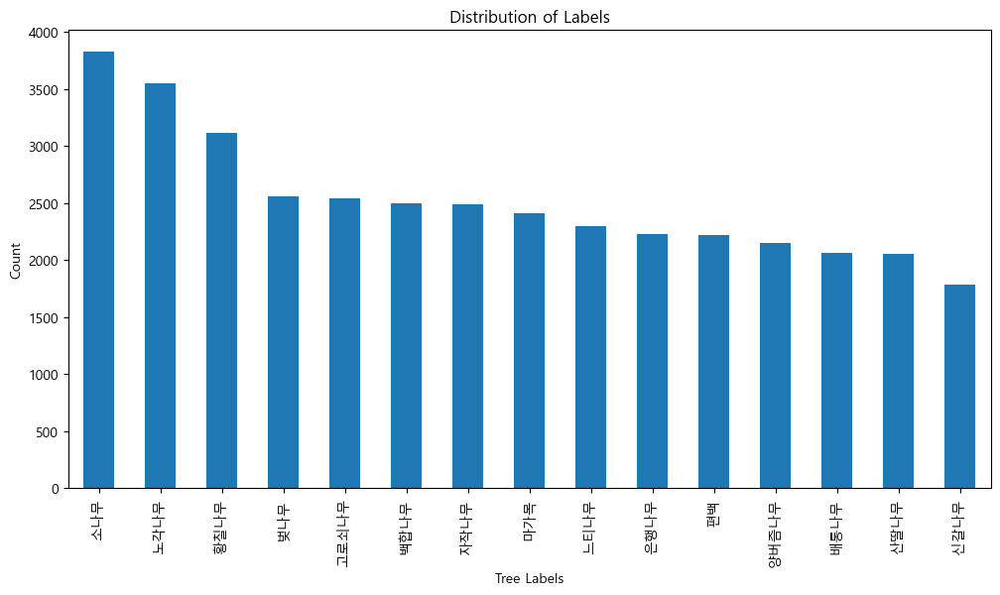

In [3]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")
# Assuming your DataFrame is named df

# Count the occurrences of each label
label_counts = df['label'].value_counts()
# Plot the distribution
plt.rc('font', family='Malgun Gothic')
plt.figure(figsize=(12, 6))
label_counts.plot(kind='bar')
plt.title('Distribution of Labels')
plt.xlabel('Tree Labels')
plt.ylabel('Count')
plt.show()

In [4]:
print(df['label'].unique())
print(len(df['label'].unique()))

['고로쇠나무' '노각나무' '느티나무' '마가목' '배롱나무' '백합나무' '벚나무' '산딸나무' '소나무' '신갈나무'
 '양버즘나무' '은행나무' '자작나무' '편백' '황칠나무']
15


In [5]:


# Assuming your DataFrame is named df with columns 'label' and 'path'
label_encoder = LabelEncoder()
df['label_encoded'] = label_encoder.fit_transform(df['label'])

# Split the dataset into train, test, and validation sets based on label ratios
train_ratio = 0.7
test_ratio = 0.15
valid_ratio = 0.15

train, test_valid = train_test_split(df, test_size=(test_ratio + valid_ratio), random_state=42, stratify=df['label_encoded'])
test, valid = train_test_split(test_valid, test_size=valid_ratio/(test_ratio + valid_ratio), random_state=42, stratify=test_valid['label_encoded'])

# Optional: Drop the label_encoded column if not needed
train = train.drop(columns=['label'])
test = test.drop(columns=['label'])
valid = valid.drop(columns=['label'])

# Print the number of samples in each set
print(f"Train set: {len(train)} samples")
print(f"Test set: {len(test)} samples")
print(f"Validation set: {len(valid)} samples")

Train set: 26440 samples
Test set: 5666 samples
Validation set: 5666 samples


In [6]:
train

,path,label_encoded
10227,./images\마가목\9346_마가목.jpg,3
29602,./images\은행나무\21364_은행나무.jpg,11
1041,./images\고로쇠나무\13270_고로쇠나무.jpg,0
7803,./images\느티나무\11713_느티나무.jpg,2
17540,./images\벚나무\659_벚나무.jpg,6
...,...,...
24438,./images\신갈나무\22775_신갈나무.jpg,9
29634,./images\은행나무\21396_은행나무.jpg,11
34573,./images\편백\16905_편백.jpg,13
21219,./images\소나무\58760_소나무.jpg,8


In [7]:
decoded_predictions = label_encoder.inverse_transform([8, 0, 2])

In [8]:
decoded_predictions

array(['소나무', '고로쇠나무', '느티나무'], dtype=object)

In [9]:
df

,label,path,label_encoded
0,고로쇠나무,./images\고로쇠나무\12226_고로쇠나무.jpg,0
1,고로쇠나무,./images\고로쇠나무\12227_고로쇠나무.jpg,0
2,고로쇠나무,./images\고로쇠나무\12228_고로쇠나무.jpg,0
3,고로쇠나무,./images\고로쇠나무\12229_고로쇠나무.jpg,0
4,고로쇠나무,./images\고로쇠나무\12230_고로쇠나무.jpg,0
...,...,...,...
37767,황칠나무,./images\황칠나무\53360_황칠나무.jpg,14
37768,황칠나무,./images\황칠나무\53361_황칠나무.jpg,14
37769,황칠나무,./images\황칠나무\53362_황칠나무.jpg,14
37770,황칠나무,./images\황칠나무\53363_황칠나무.jpg,14


In [10]:
BATCH_SIZE = 8

class TreeDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        out = dict()
        img_path = self.dataframe['path'].iloc[idx]
        image = Image.open(img_path).convert("RGB")

        # image = cv2.imread(img_path)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image)
        image = image.clone().detach().requires_grad_(True).to(torch.float)
        # label = self.dataframe['label_encoded'].iloc[idx]
        label = torch.tensor(self.dataframe['label_encoded'].iloc[idx], dtype=torch.long)
        # out['x'] = image.clone().detach().requires_grad_(True).to(torch.float)
        # out['y'] =  label
        return image, label


# 이미지 변환을 위한 torchvision.transforms 정의
transform = transforms.Compose([
    # transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_ratio = 0.7
test_ratio = 0.15
valid_ratio = 0.15

train, test_valid = train_test_split(df, test_size=(test_ratio + valid_ratio), random_state=42, stratify=df['label_encoded'])
test, valid = train_test_split(test_valid, test_size=valid_ratio/(test_ratio + valid_ratio), random_state=42, stratify=test_valid['label_encoded'])

train = train.drop(columns=['label'])
test = test.drop(columns=['label'])
valid = valid.drop(columns=['label'])

train_dataset = TreeDataset(dataframe=train, transform=transform)
test_dataset = TreeDataset(dataframe=test, transform=transform)
valid_dataset = TreeDataset(dataframe=valid, transform=transform)
print(len(train_dataset))
print(len(test_dataset))
print(len(valid_dataset))

26440
5666
5666


In [11]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
print(len(train_loader))
print(len(valid_loader))
print(len(test_loader))

3305
709
709


In [12]:
train

,path,label_encoded
10227,./images\마가목\9346_마가목.jpg,3
29602,./images\은행나무\21364_은행나무.jpg,11
1041,./images\고로쇠나무\13270_고로쇠나무.jpg,0
7803,./images\느티나무\11713_느티나무.jpg,2
17540,./images\벚나무\659_벚나무.jpg,6
...,...,...
24438,./images\신갈나무\22775_신갈나무.jpg,9
29634,./images\은행나무\21396_은행나무.jpg,11
34573,./images\편백\16905_편백.jpg,13
21219,./images\소나무\58760_소나무.jpg,8


In [13]:
images = []
for p in train['path'][:16]:
    stream = open(p, "rb")
    bytes = bytearray(stream.read())
    numpyarray = np.asarray(bytes, dtype=np.uint8)
    bgrImage = cv2.imdecode(numpyarray, cv2.IMREAD_UNCHANGED)
    images.append(bgrImage)

In [14]:
# EXIF 데이터를 통해 이미지 방향을 수정하는 함수
def correct_image_orientation(img):
    try:
        exif = img._getexif()
        if exif is not None:
            for orientation_tag, orientation_value in ExifTags.TAGS.items():
                if orientation_value == 'Orientation':
                    orientation = exif.get(orientation_tag)
                    if orientation == 3:
                        img = img.rotate(180, expand=True)
                    elif orientation == 6:
                        img = img.rotate(270, expand=True)
                    elif orientation == 8:
                        img = img.rotate(90, expand=True)
    except (AttributeError, KeyError, IndexError, TypeError):
        # EXIF 데이터가 없거나, 태그를 찾을 수 없거나, 이미지 포맷이 EXIF를 지원하지 않는 경우
        pass
    return img


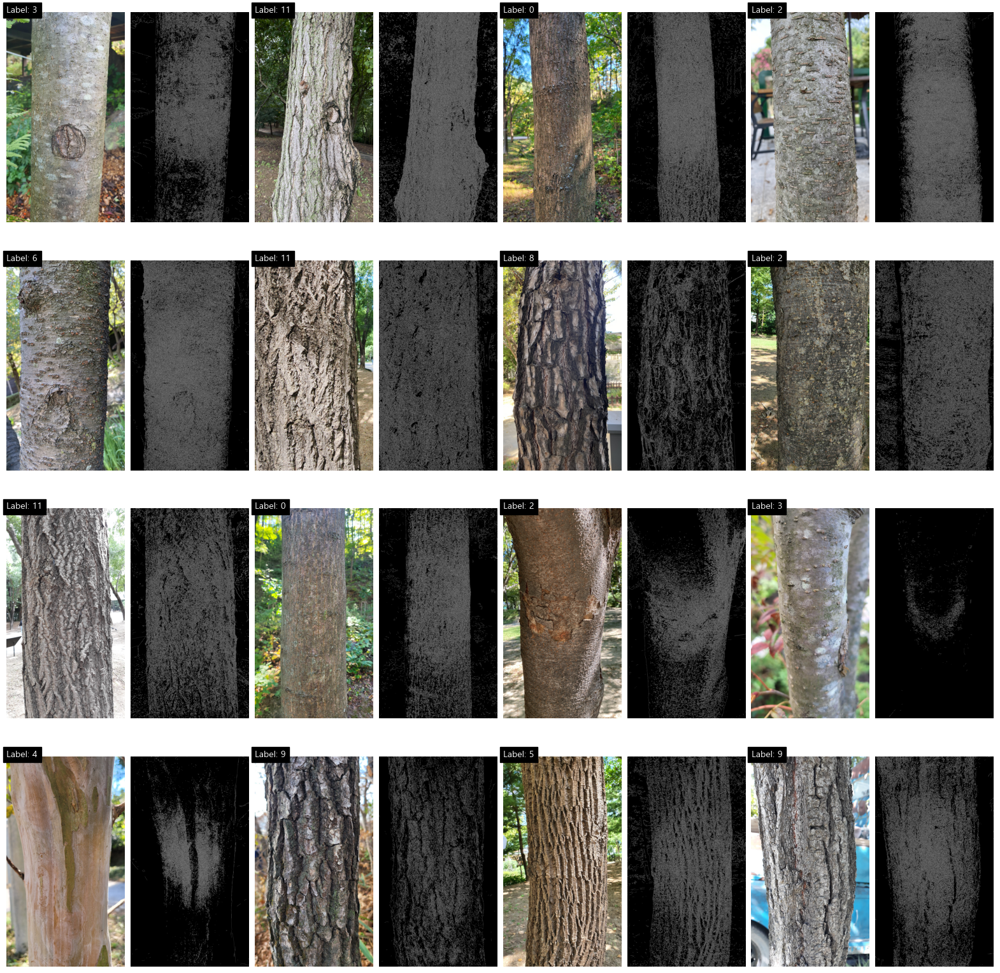

In [15]:
# 'train' 데이터프레임에서 파일 경로와 레이블을 사용하여 이미지를 로드하고 표시
fig = plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(4, 8, wspace=0.05, hspace=0.05)

edges = []

for i in range(16):
    ax1 = plt.subplot(gs[i//4, 2*(i%4)])
    img_path = train['path'].iloc[i]
    label = train['label_encoded'].iloc[i]

    # 이미지 파일을 열고 방향을 조정한 뒤 표시
    img = Image.open(img_path)
    img_corrected = correct_image_orientation(img)
    ax1.imshow(img_corrected)
    ax1.text(5, 10, f"Label: {label}", color='white', backgroundcolor='black')
    ax1.axis('off')  # 축 좌표를 제거

    ax2 = plt.subplot(gs[i//4, 2*(i%4)+1])
    # 원본 이미지를 올바른 방향으로 회전시킨 후 에지 감지 수행
    img_corrected_np = np.array(img_corrected)  # PIL 이미지를 NumPy 배열로 변환
    img_gray = cv2.cvtColor(img_corrected_np, cv2.COLOR_RGB2GRAY)  # 그레이스케일로 변환
    edge_correct = cv2.Canny(img_gray, 100, 200)  # 에지 감지\
    edges.append(edge_correct)
    ax2.imshow(edge_correct, cmap='gray')
    ax2.axis('off')  # 축 좌표를 제거

plt.show()

In [16]:
train['path'].iloc[14]

'./images\\백합나무\\3153_백합나무.jpg'

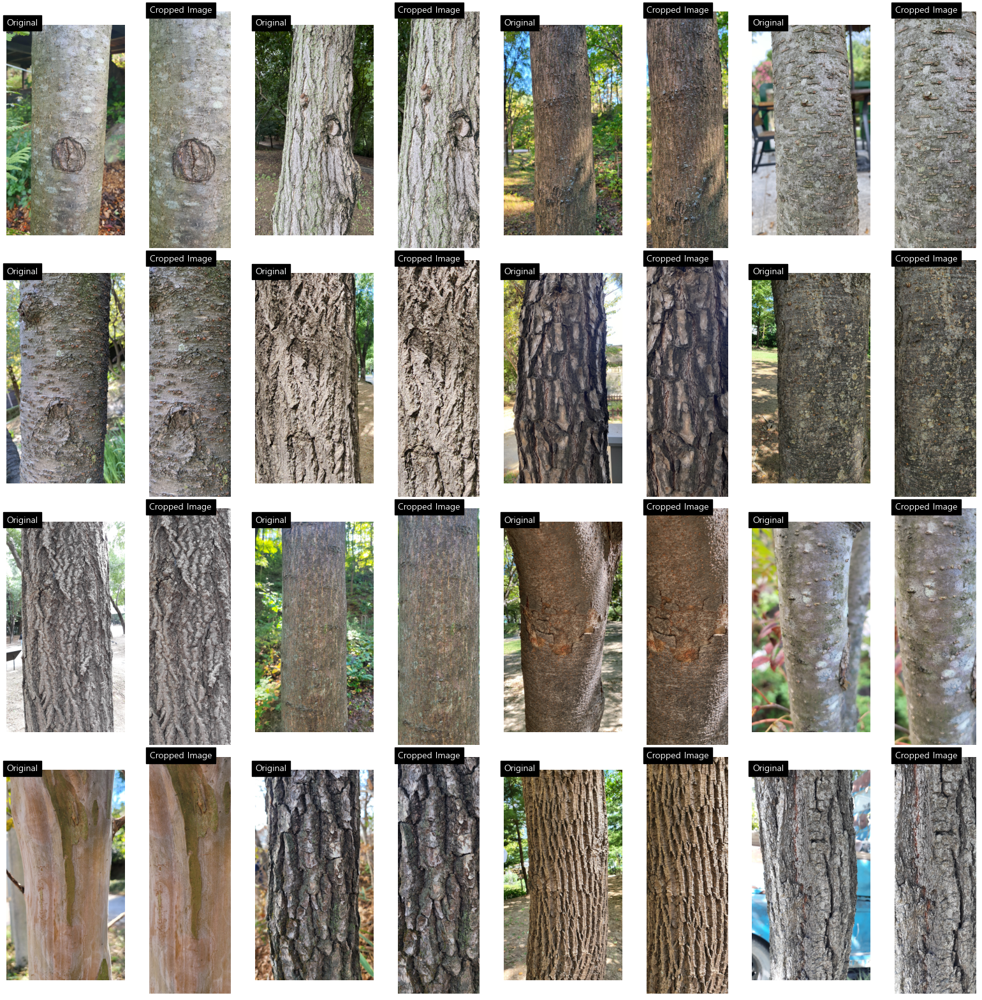

In [37]:
cropped_images = []
# plt.figure(figsize=(15, 15))

# 이미지의 중앙에서 일정 비율만큼 잘라내기 위한 함수
def crop_center(img, crop_width_ratio=0.55, crop_height_ratio=0.9):
    img_width, img_height = img.size
    x = (img_width - int(img_width * crop_width_ratio)) // 2
    y = (img_height - int(img_height * crop_height_ratio)) // 2
    w = int(img_width * crop_width_ratio)
    h = int(img_height * crop_height_ratio)

    return img.crop((x, y, x + w, y + h))


fig = plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(4, 8, wspace=0.05, hspace=0.05)

edges = []

for i in range(16):
    ax1 = plt.subplot(gs[i//4, 2*(i%4)])
    img_path = train['path'].iloc[i]
    label = train['label_encoded'].iloc[i]

    # 이미지 파일을 열고 방향을 조정한 뒤 표시
    img = Image.open(img_path)
    img_corrected = correct_image_orientation(img)
    ax1.imshow(img_corrected)
    ax1.text(5, 10, f"Original", color='white', backgroundcolor='black')
    ax1.axis('off')  # 축 좌표를 제거

    # 이미지 중앙을 기준으로 잘라내기
    cropped_image = crop_center(img_corrected)
    cropped_images.append(cropped_image)

    ax2 = plt.subplot(gs[i//4, 2*(i%4)+1])
    # 시각화
    ax2.imshow(cropped_image)
    ax2.text(5, 10, f"Cropped Image", color='white', backgroundcolor='black')
    ax2.axis('off')  # 축 좌표를 제거

plt.show()

crop이미지 저장 코드

In [19]:
# df['cropped_images'] = None  # 새 열을 초기화합니다.

# for i in range(len(df)):
#     img_path = df['path'].iloc[i]
#     img = Image.open(img_path)
#     img_corrected = correct_image_orientation(img)

#     # 이미지 중앙을 기준으로 잘라내기
#     cropped_image = crop_center(img_corrected)
#     df.at[i, 'cropped_images'] = cropped_image
#     if i % 1000 == 0:
#         print(i)

### 전체 데이터 셋에 대한 밝기의 평균과 표준편차를 구해 정규화 하는 코드

In [32]:


# print(images)
gray_images = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]

# 데이터셋 전체의 평균 밝기와 표준 편차 계산
mean_brightness = np.mean([np.mean(img) for img in gray_images])
std_brightness = np.mean([np.std(img) for img in gray_images])

# 목표 밝기와 표준 편차 설정 (예를 들어, 전체 데이터셋의 평균을 사용)
target_mean = mean_brightness
target_std = std_brightness

# 정규화된 이미지 리스트 초기화
normalized_images = []

for p in train['path'][:16]:
    
    # 이미지 로드 및 방향 조정
    img = Image.open(p)
    img_mean = np.mean(img)
    img_std = np.std(img)
    img_corrected = correct_image_orientation(img)
    img_corrected_np = np.array(img_corrected)

    # 정규화 식: 정규화 식 (픽셀값 - 이미지평균) / 이미지표준편차 * 목표표준편차 + 목표평균
    normalized_img = (img_corrected_np - img_mean) / (img_std + 1e-6) * target_std + target_mean
    normalized_img = np.clip(normalized_img, 0, 255).astype('uint8')
    normalized_images.append(normalized_img)

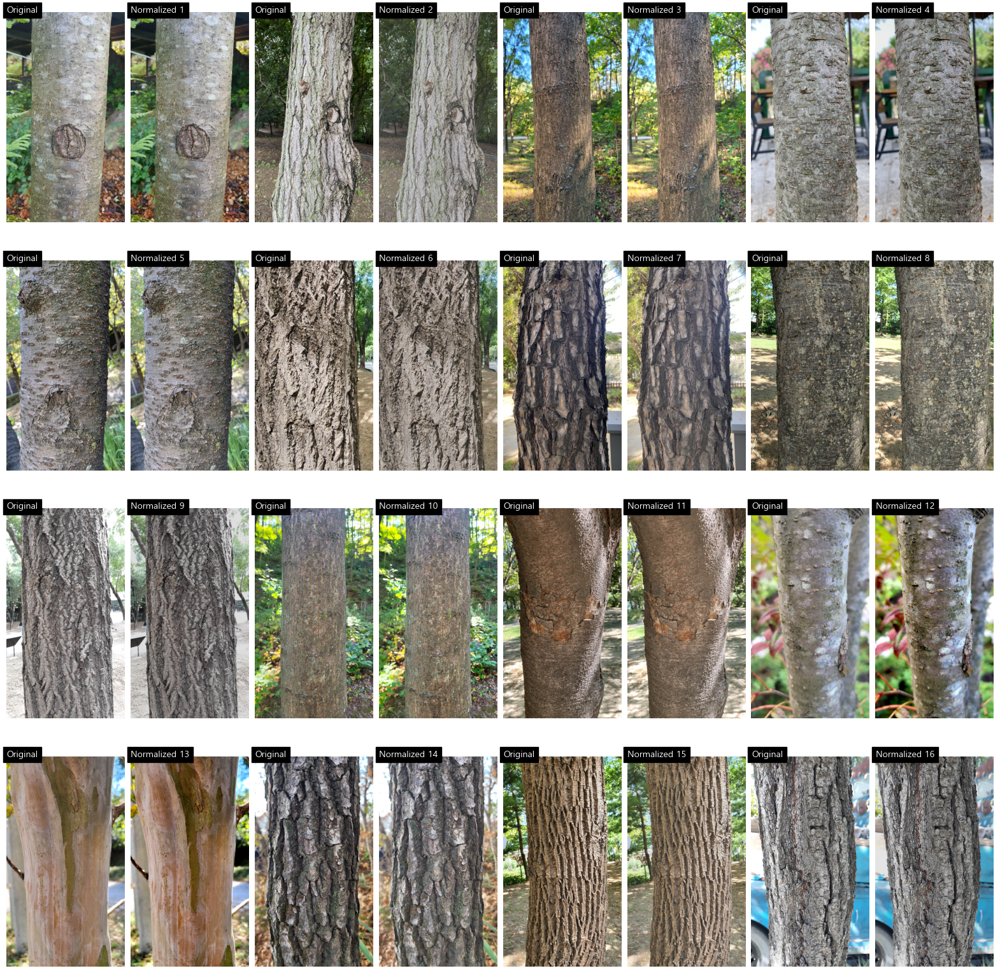

In [36]:
# 'train' 데이터프레임에서 파일 경로와 레이블을 사용하여 이미지를 로드하고 표시
fig = plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(4, 8, wspace=0.05, hspace=0.05)

edges = []

for i in range(16):
    
    ax1 = plt.subplot(gs[i//4, 2*(i%4)])
    img_path = train['path'].iloc[i]
    label = train['label_encoded'].iloc[i]

    # 이미지 파일을 열고 방향을 조정한 뒤 표시
    img = Image.open(img_path)
    img_corrected = correct_image_orientation(img)
    img_corrected_np = np.array(img_corrected)
    ax1.imshow(img_corrected_np)
    ax1.text(5, 10, f"Original", color='white', backgroundcolor='black')
    ax1.axis('off')  # 축 좌표를 제거

    ax2 = plt.subplot(gs[i//4, 2*(i%4)+1])
    # nor_img = Image.open(normalized_images[i])
    ax2.imshow(normalized_images[i])
    ax2.text(5, 10, f"Normalized {i+1}", color='white', backgroundcolor='black')
    ax2.axis('off')  # 축 좌표를 제거

plt.show()